Install required packages/Cai dat cac thu vien can thiet

In [2]:
! pip install numpy

In [3]:
! pip install pandas


In [4]:
! pip install networkx

In [5]:
! pip install matplotlib

In [6]:
! pip install matplotlib-inline

In [7]:
! pip install community

In [8]:
! pip install python-louvain

In [9]:
import pandas as pd

Lam sach du lieu

In [10]:
df = pd.read_csv('vgsales.csv', usecols = ['Genre', 'Publisher'])
df_new = df.drop_duplicates().iloc[:-1500]
df_new

,Genre,Publisher
0,Sports,Nintendo
1,Platform,Nintendo
2,Racing,Nintendo
4,Role-Playing,Nintendo
5,Puzzle,Nintendo
...,...,...
2585,Strategy,Banpresto
2596,Action,20th Century Fox Video Games
2598,Adventure,Avanquest Software
2604,Simulation,Hudson Entertainment


Chuyen doi thanh do thi 2 phia va 1 phia

In [11]:
import networkx as nx
from networkx.algorithms import bipartite
g_1 = nx.Graph()
publishers = df_new['Publisher']
genres = df_new['Genre']
print("Number of publishers: ", publishers.nunique())
print("Number of genres: ", genres.nunique())
print("Number of edges: ", len(df_new))

Number of publishers:  123
Number of genres:  12
Number of edges:  337


In [12]:
for index, row in df_new.iterrows():
    g_1.add_edge(row['Genre'], row['Publisher'], weight = 1)
    g_1.add_nodes_from(genres, bipartite = 0)
    g_1.add_nodes_from(publishers, bipartite = 1)

<Figure size 1500x1500 with 0 Axes>

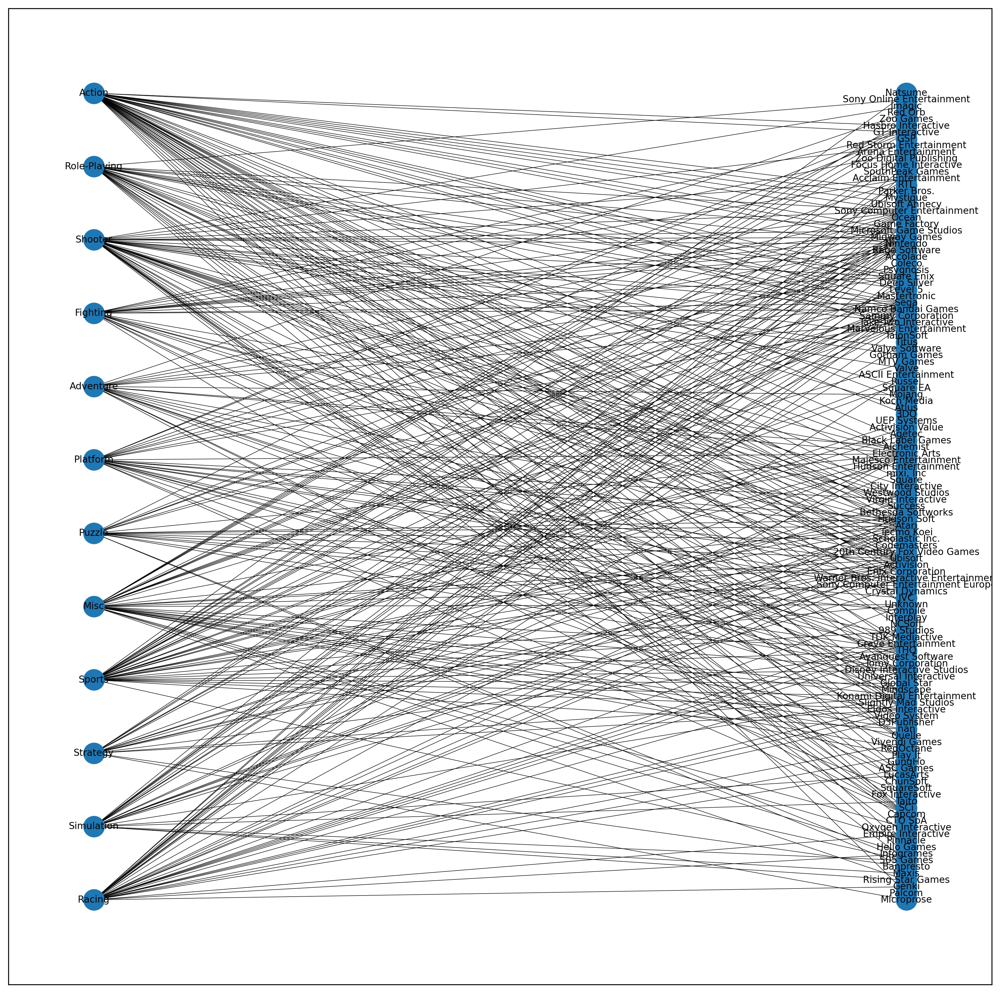

In [13]:
import matplotlib.pyplot as plt
plt.figure(figsize = (15, 15))
pos = nx.spring_layout(g_1)
fig, ax = plt.subplots(1, 1, figsize = (15, 15), dpi = 300)
nx.draw_networkx(g_1, pos = nx.drawing.layout.bipartite_layout(g_1, genres), font_size = 8, width = 0.4)

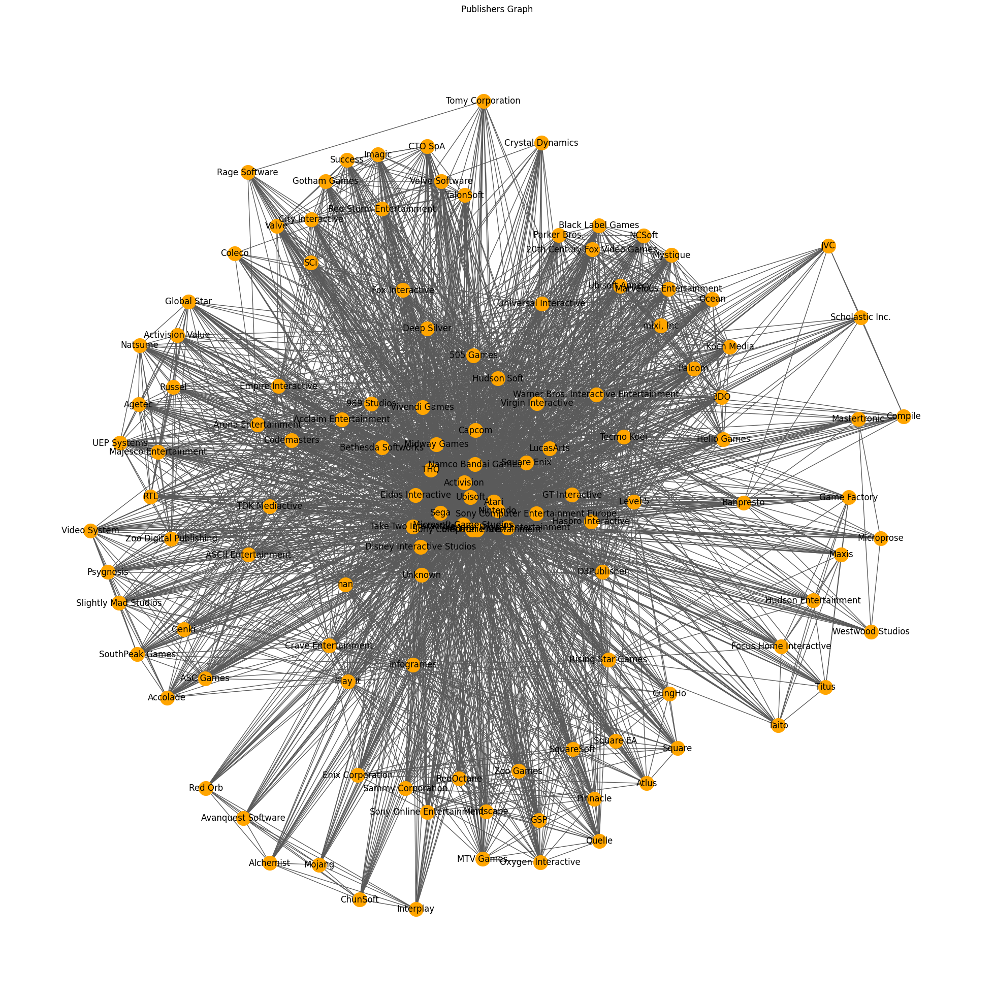

In [14]:
# Remove duplicated publishers from rows of dataframe:
final_publishers = publishers.drop_duplicates()
g_2 = bipartite.weighted_projected_graph(g_1, final_publishers)
plt.figure(figsize = (25, 25))

layout = nx.spring_layout(g_2)

nx.draw_networkx_nodes(
    g_2,
    layout,
    nodelist = final_publishers,
    node_size = 400,
    node_color = 'orange'
)
nx.draw_networkx_edges(g_2, layout, edge_color = '#5A5A5A')
node_labels = dict(zip(final_publishers, final_publishers))
nx.draw_networkx_labels(g_2, layout, labels = node_labels)
plt.axis('off')
plt.title('Publishers Graph')

plt.show()


Xuat do thi 1 phia ra Gephi

In [15]:
labels = nx.get_edge_attributes(g_2, 'weight')
df2 = pd.DataFrame(columns = ['source', 'target', 'weight'])
for key, value in labels.items():
    df2 = df2.append({'source': key[0], 'target': key[1], 'weight': value}, ignore_index = True)
# Export to .csv file to be used in Gephi
df2.to_csv('vgsales_gephi.csv', index = False, header = True)
# If this file is compiled with Google Colab please add '/' before the file name to get the 
# exported csv in the root directory as below:
# df2.to_csv('/vgsales_gephi.csv', index = False, header = True)

C:\Users\minhn\AppData\Local\Temp\ipykernel_9748\566239561.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append({'source': key[0], 'target': key[1], 'weight': value}, ignore_index = True)
C:\Users\minhn\AppData\Local\Temp\ipykernel_9748\566239561.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append({'source': key[0], 'target': key[1], 'weight': value}, ignore_index = True)
C:\Users\minhn\AppData\Local\Temp\ipykernel_9748\566239561.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append({'source': key[0], 'target': key[1], 'weight': value}, ignore_index = True)
C:\Users\minhn\AppData\Local\Temp\ipykernel_9748\566239561.py:4: FutureWarning: The frame.append method is deprecated and

Phat hien cong dong bang thuat toan Louvain

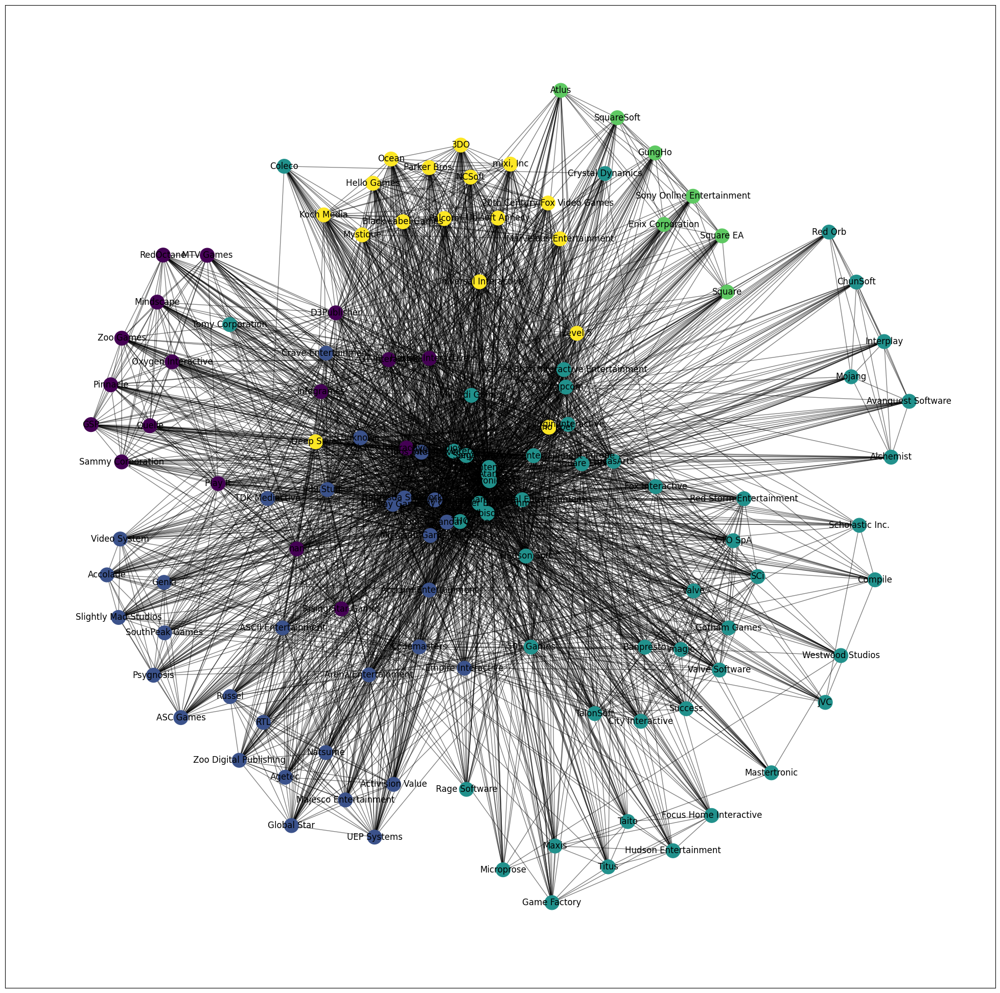

In [16]:
import matplotlib.cm as cm
import matplotlib
from community import community_louvain

plt.figure(figsize = (25, 25))

# Compute the best partition
partition = community_louvain.best_partition(g_2)

# Draw the graph
pos = nx.spring_layout(g_2)
# Color the nodes according to their partitions
cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
nx.draw_networkx_nodes(g_2, pos, partition.keys(), node_size = 400, cmap = cmap, node_color = 
list(partition.values()))
nx.draw_networkx_edges(g_2, pos, alpha = 0.5)
nx.draw_networkx_labels(g_2, pos)

plt.show()

Liet ke cac cong dong

In [17]:
import numpy as np
values = list(partition.values())

# Print number of communities
print('Number of communities: ', len(np.unique(values)))

Number of communities:  5


In [18]:
for i in range(len(np.unique(values))):
    print("---------", "Community ", i + 1, "---------")
    print("")
    for name, k in partition.items():
        if k == i:
            print(name)
    print("")

--------- Community  1 ---------

GT Interactive
RedOctane
Hasbro Interactive
MTV Games
Disney Interactive Studios
nan
Mindscape
Infogrames
D3Publisher
Oxygen Interactive
Rising Star Games
Zoo Games
GSP
Play It
Sammy Corporation
Pinnacle
Quelle

--------- Community  2 ---------

Microsoft Game Studios
Activision
Bethesda Softworks
Eidos Interactive
Namco Bandai Games
Acclaim Entertainment
Majesco Entertainment
Codemasters
Arena Entertainment
Midway Games
989 Studios
UEP Systems
ASCII Entertainment
Unknown
Activision Value
Video System
Global Star
Crave Entertainment
TDK Mediactive
ASC Games
Accolade
RTL
Natsume
SouthPeak Games
Zoo Digital Publishing
Psygnosis
Empire Interactive
Russel
Agetec
Slightly Mad Studios
Genki

--------- Community  3 ---------

Nintendo
Take-Two Interactive
Sony Computer Entertainment
Ubisoft
Electronic Arts
Sega
Atari
505 Games
Capcom
Konami Digital Entertainment
Sony Computer Entertainment Europe
Square Enix
LucasArts
Virgin Interactive
Warner Bros. Interacti